## Linear Regression vs. Logistic Regression

In the previous tutorial we attempted to predict a person's annual medical charges using _linear regression_. In this tutorial, we'll use _logistic regression_, which is better suited for _classification_ problems like predicting whether it will rain tomorrow. Identifying whether a given problem is a _classfication_ or _regression_ problem is an important first step in machine learning.

### Classification Problems


Problems where each input must be assigned a discrete category (also called label or class) are known as _classification problems_. 

Classification problems can be binary (yes/no) or multiclass (picking one of many classes). 

But the output will be the probability of whether the thing that will happen or not.


### Regression Problems

Problems where a continuous numeric value must be predicted for each input are known as _regression problems_.

### Linear Regression for Solving Regression Problems

Linear regression is a commonly used technique for solving regression problems. In a linear regression model, the target is modeled as a linear combination (or weighted sum) of input features. The predictions from the model are evaluated using a loss function like the Root Mean Squared Error (RMSE).


Here's a visual summary of how a linear regression model is structured:

<img src="https://i.imgur.com/iTM2s5k.png" width="480">


For a mathematical discussion of linear regression, watch [this YouTube playlist](https://www.youtube.com/watch?v=kHwlB_j7Hkc&list=PLJs7lEb1U5pYnrI0Wn4mzPmppVqwERL_4&index=1)

### Logistic Regression for Solving Classification Problems

Logistic regression is a commonly used technique for solving binary classification problems. In a logistic regression model: 

- we take linear combination (or weighted sum of the input features) 
- we apply the sigmoid function to the result to obtain a number between 0 and 1
- this number represents the probability of the input being classified as "Yes"
- instead of RMSE, the cross entropy loss function is used to evaluate the results


Here's a visual summary of how a logistic regression model is structured ([source](http://datahacker.rs/005-pytorch-logistic-regression-in-pytorch/)):


<img src="https://i.imgur.com/YMaMo5D.png" width="480">

The sigmoid function applied to the linear combination of inputs has the following formula:

<img src="https://i.imgur.com/sAVwvZP.png" width="400">


The output of the sigmoid function is called a logistic, hence the name _logistic regression_. For a mathematical discussion of logistic regression, sigmoid activation and cross entropy, check out [this YouTube playlist](https://www.youtube.com/watch?v=-la3q9d7AKQ&list=PLNeKWBMsAzboR8vvhnlanxCNr2V7ITuxy&index=1). Logistic regression can also be applied to multi-class classification problems, with a few modifications.

### Machine Learning Workflow

Whether we're solving a regression problem using linear regression or a classification problem using logistic regression, the workflow for training a model is exactly the same:

1. We initialize a model with random parameters (weights & biases).
2. We pass some inputs into the model to obtain predictions.
3. We compare the model's predictions with the actual targets using the loss function (in case of logistic regression it is the probability of thing to be happen or not).  
4. We use an optimization technique (like least squares, gradient descent etc.) to reduce the loss by adjusting the weights & biases of the model
5. We repeat steps 1 to 4 till the predictions from the model are good enough.


<img src="https://i.imgur.com/g32CoIy.png" width="480">


Classification and regression are both supervised machine learning problems, because they use labeled data. Machine learning applied to unlabeled data is known as unsupervised learning ([image source](https://au.mathworks.com/help/stats/machine-learning-in-matlab.html)). 

<img src="https://i.imgur.com/1EMQmAw.png" width="480">


In this tutorial, we'll train a _logistic regression_ model using the Rain in Australia dataset to predict whether or not it will rain at a location tomorrow, using today's data. This is a _binary classification_ problem.



## Downloading the Data

We'll use the [`opendatasets` library](https://github.com/JovianML/opendatasets) to download the data from Kaggle directly within Jupyter. Let's install and import `opendatasets`.

In [1]:
! pip install opendatasets --upgrade --quiet

In [2]:
import opendatasets as od
od.version()


'0.1.22'

In [3]:
dataset_url = 'https://www.kaggle.com/jsphyg/weather-dataset-rattle-package'
od.download(dataset_url)

Skipping, found downloaded files in ".\weather-dataset-rattle-package" (use force=True to force download)


Once the above command is executed, the dataset is downloaded and extracted to the the directory `weather-dataset-rattle-package`.

In [4]:
import os
data_dir = './weather-dataset-rattle-package'
os.listdir(data_dir)

['weatherAUS.csv']

In [5]:
train_csv = data_dir + '/weatherAUS.csv'

In [6]:
import pandas as pd

data = pd.read_csv(train_csv)
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [7]:
data.shape

(145460, 23)

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [9]:
# Dropping rows with null values in the columns RainToday and RainTomorrow as these rows are anyhow no use of model

data.dropna(subset=["RainToday", "RainTomorrow"], inplace=True)
 

In [10]:
data.shape


(140787, 23)

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 140787 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           140787 non-null  object 
 1   Location       140787 non-null  object 
 2   MinTemp        140319 non-null  float64
 3   MaxTemp        140480 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81093 non-null   float64
 6   Sunshine       73982 non-null   float64
 7   WindGustDir    131624 non-null  object 
 8   WindGustSpeed  131682 non-null  float64
 9   WindDir9am     131127 non-null  object 
 10  WindDir3pm     137117 non-null  object 
 11  WindSpeed9am   139732 non-null  float64
 12  WindSpeed3pm   138256 non-null  float64
 13  Humidity9am    139270 non-null  float64
 14  Humidity3pm    137286 non-null  float64
 15  Pressure9am    127044 non-null  float64
 16  Pressure3pm    127018 non-null  float64
 17  Cloud9am       88162 non-null

In [12]:
data.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,140319.000000,140480.00000,140787.000000,81093.000000,73982.000000,131682.000000,139732.000000,138256.000000,139270.000000,137286.000000,127044.000000,127018.000000,88162.000000,84693.000000,140131.000000,138163.000000
mean,12.184824,23.23512,2.349974,5.472516,7.630540,39.970520,13.990496,18.631141,68.826833,51.449288,1017.654577,1015.257963,4.431161,4.499250,16.987066,21.693183
std,6.403879,7.11450,8.465173,4.189132,3.781729,13.578201,8.886210,8.798096,19.063650,20.807310,7.104867,7.035411,2.886594,2.719752,6.496012,6.937784
min,-8.500000,-4.80000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,7.600000,17.90000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.000000,1010.400000,1.000000,2.000000,12.300000,16.600000
50%,12.000000,22.60000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000
75%,16.800000,28.30000,0.800000,7.400000,10.700000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000
max,33.900000,48.10000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


## Exploratory Data Analysis and Visualization

Before training a machine learning model, its always a good idea to explore the distributions of various columns and see how they are related to the target column. Let's explore and visualize the data using the Plotly, Matplotlib and Seaborn libraries. 


In [13]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

### Location vs. Rainy Days

In [14]:
# Working with Locations

data["Location"].nunique()

49

In [15]:
px.histogram(data, x='Location', title='Location vs. Rainy Days', color='RainToday')

Observations made are:

1. Considering 365 days of a year and we are working with 10 years data our dataset have fairly 3000 datasets for each cities which is okay to overlook some outliers having days greater or less than 3000. 

2. Except some exceptions the data of many cities have More than 80% of rainfall and 20%-10% of Rain based on some outliers.


### Temperature at 9 am vs. Rain Tomorrow

In [16]:
px.histogram(data, 
             x = 'Temp9am', 
             title = 'Temperature at 9 am vs. Rain Tomorrow', 
             color = 'RainTomorrow')

Observation made are:

1. The histogram plot is like a gaussian curve or normal distribution.

2. This plot shows that there are more cases of high temperature and Rain Tomorrow as per the comparison with low temperature and rainfall tomorrow.

3. This means that if temperature is increases after 9 am it is has more chances of having rain tomorrow.

### Temperature at 3 pm vs. Rain Tomorrow

In [17]:
px.histogram(data, 
             x = 'Temp3pm', 
             title = 'Temperature at 3 pm vs. Rain Tomorrow', 
             color = 'RainTomorrow')

Observation made are:

1. The histogram plot is like a gaussian curve or normal distribution.

2. The drastic change in this plot is that there are more cases of low temperature and Rain Tomorrow as per the comparison with high temperature and rainfall tomorrow as previous 9 am plot.

3. This means that if temperature is falling after 3 pm it is has more chances of having rain tomorrow.

### Min Temp. vs Max Temp.

In [18]:
px.scatter(data.sample(2000), 
           title='Min Temp. vs Max Temp.',
           x='MinTemp', 
           y='MaxTemp', 
           color='RainToday')

Observations made are:

1. There is a linear relation between Max Temp and Min Temp.

2. When there is a rain on a particular day then the variation in temperature is small maybe be this can be also relevant for whether it rains tomorrow or not.

### Temp (3 pm) vs. Humidity (3 pm)

In [19]:
px.scatter(data.sample(2000), 
           title='Temp (3 pm) vs. Humidity (3 pm)',
           x='Temp3pm',
           y='Humidity3pm',
           color='RainTomorrow')

Obseravtions made are:

1. It can be seen in this plot, the red points are in the low temp and high humidity region whereas the blue points are in the high temp and low humidity region.

2. Where temperature is low but humidity is higher there is a high chance that there will be rainfall tomorrow and vice versa.



### Rain Tomorrow vs. Rain Today

In [20]:
px.histogram(data, 
             x='RainTomorrow', 
             color='RainToday', 
             title='Rain Tomorrow vs. Rain Today')

Observations made are:

1. Class Imbalance is seen in this plot as clearly the dataset is not balanced with huge margin. This is a problem to slove before the model building as it will produce a biased output. 

2.1. Also, there were 92K instances where there were neither rain today nor tomorrow, but for 16k instances there were rain today but not tomorrow. Which means if it doesn't rain today, there is a pretty good chances that there will be no rain tomorrow.

2.2. Whereas, on the other side we can see an even split, which means that if it did rain today, it may or may not be rain tomorrow.

3. Hence, predicting rain tomorrow is easier when there is no rain today. But the other way definitely includes other features also.

## (Optional) Working with a Sample

When working with massive datasets containing millions of rows, it's a good idea to work with a sample initially, to quickly set up your model training notebook. If you'd like to work with a sample, just set the value of `use_sample` to `True`.

In [21]:
use_sample = True # False
sample_fraction = 0.1

if use_sample:
    data = data.sample(frac = sample_fraction).copy()

# Make sure to set `use_sample` to `False` and re-run the notebook end-to-end once you're ready to use the entire dataset.

## Splitting of datasets 

There are 2 methods of splitting the datasets while distributing it into training, validation and test datasets:

1. Using  60-20-20 split method
2. If working with time data then it is necessary to split dataset based on the timeline as you cannot train your model with future data and cannot test it with past data using random split. So, the better approach is to split it based on the years.

## Training, Validation and Test Sets

While building real-world machine learning models, it is quite common to split the dataset into three parts:

1. **Training set** - used to train the model, i.e., compute the loss and adjust the model's weights using an optimization technique. 


2. **Validation set** - used to evaluate the model during training, tune model hyperparameters (optimization technique, regularization etc.), and pick the best version of the model. Picking a good validation set is essential for training models that generalize well. [Learn more here.](https://www.fast.ai/2017/11/13/validation-sets/)


3. **Test set** - used to compare different models or approaches and report the model's final accuracy. For many datasets, test sets are provided separately. The test set should reflect the kind of data the model will encounter in the real-world, as closely as feasible.


<img src="https://i.imgur.com/j8eITrK.png" width="480">


As a general rule of thumb you can use around 60% of the data for the training set, 20% for the validation set and 20% for the test set. If a separate test set is already provided, you can use a 75%-25% training-validation split.


When rows in the dataset have no inherent order, it's common practice to pick random subsets of rows for creating test and validation sets. This can be done using the `train_test_split` utility from `scikit-learn`. Learn more about it here: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

In [22]:
from sklearn.model_selection import train_test_split

In [23]:
train_val_df, test_df = train_test_split(data, test_size= 0.2, random_state= 42)
train_df, val_df = train_test_split(train_val_df, test_size= 0.25, random_state= 42)

In [24]:
print("train_df.shape", train_df.shape)
print("val_df.shape", val_df.shape)
print("test_df.shape", test_df.shape)

train_df.shape (8447, 23)
val_df.shape (2816, 23)
test_df.shape (2816, 23)


However, while working with dates, it's often a better idea to separate the training, validation and test sets with time, so that the model is trained on data from the past and evaluated on data from the future.

For the current dataset, we can use the Date column in the dataset to create another column for year. We'll pick the last two years for the test set, and one year before it for the validation set.

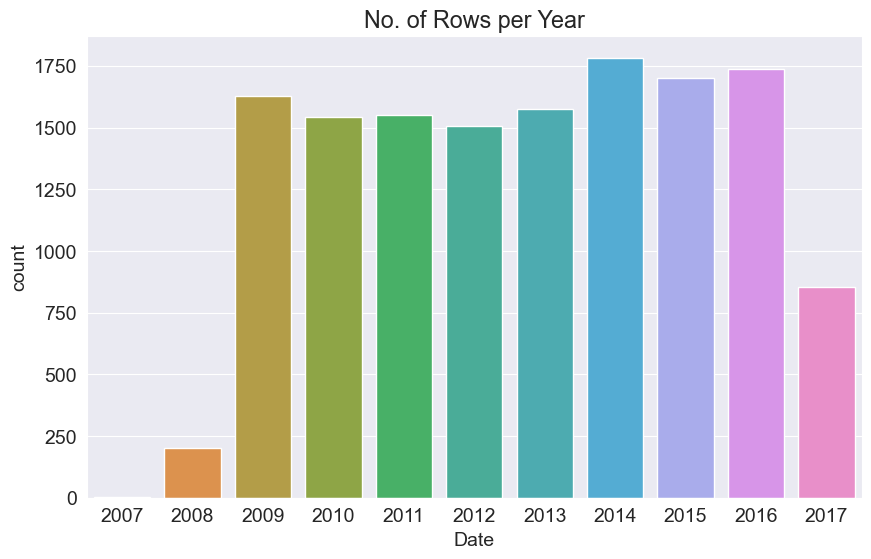

In [25]:
plt.title('No. of Rows per Year')
sns.countplot(x=pd.to_datetime(data.Date).dt.year);

In [26]:
year = pd.to_datetime(data.Date).dt.year

train_df = data[year < 2015]
val_df = data[year == 2015]
test_df = data[year > 2015]

In [27]:
val_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
23480,2015-09-17,NorfolkIsland,16.3,21.5,0.2,4.8,7.4,N,35.0,N,...,68.0,67.0,1020.6,1018.3,4.0,4.0,18.2,20.0,No,No
77238,2015-06-06,Portland,11.1,17.0,1.0,0.2,5.6,NNW,39.0,NNW,...,99.0,76.0,1027.4,1024.6,8.0,5.0,12.2,16.7,No,No
20541,2015-11-26,NorahHead,20.8,39.3,0.0,NaN,NaN,SSE,70.0,NNW,...,49.0,12.0,1000.9,999.2,NaN,NaN,30.8,39.1,No,No
57419,2015-07-04,Ballarat,3.0,7.9,0.0,NaN,NaN,N,31.0,N,...,80.0,76.0,1023.8,1022.2,8.0,8.0,4.9,7.6,No,No
44800,2015-05-01,Wollongong,15.2,19.3,53.0,NaN,NaN,SSE,33.0,SW,...,93.0,83.0,1029.4,1025.2,8.0,7.0,15.8,19.1,Yes,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2279,2015-05-27,Albury,5.7,14.7,0.2,NaN,NaN,ENE,20.0,NaN,...,100.0,74.0,1025.2,1022.3,7.0,8.0,8.8,14.0,No,Yes
5429,2015-10-15,BadgerysCreek,11.3,29.8,0.0,NaN,NaN,E,24.0,NW,...,100.0,39.0,NaN,NaN,NaN,NaN,16.9,28.7,No,No
83338,2015-08-27,Dartmoor,3.2,15.5,0.0,1.8,5.2,SSW,43.0,NNW,...,NaN,NaN,1023.8,1022.7,NaN,NaN,7.4,14.3,No,No
72707,2015-08-01,Mildura,5.1,15.0,1.4,5.6,1.1,NW,48.0,NNW,...,75.0,94.0,1015.5,1016.1,8.0,NaN,12.5,11.5,Yes,Yes


In [28]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (9788, 23)
val_df.shape : (1700, 23)
test_df.shape : (2591, 23)


While not a perfect 60-20-20 split, we have ensured that the test validation and test sets both contain data for all 12 months of the year.

## Identifying Input and Target Columns

Often, not all the columns in a dataset are useful for training a model. In the current dataset, we can ignore the `Date` column, since we only want to weather conditions to make a prediction about whether it will rain the next day.

Let's create a list of input columns, and also identify the target column.

In [29]:
input_cols = list(train_df.columns)[1:-1]
print("Input Columns: ", input_cols)

target_col = 'RainTomorrow'
print("Target Column: ", target_col)

Input Columns:  ['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday']
Target Column:  RainTomorrow


We can now create inputs and targets for the training, validation and test sets for further processing and model training.

In [30]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

In [31]:
train_inputs


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
126989,Walpole,10.2,16.3,6.6,NaN,NaN,NW,28.0,WNW,WSW,...,11.0,99.0,71.0,1025.1,1023.3,NaN,NaN,12.3,15.6,Yes
40299,Williamtown,20.1,42.5,0.0,9.8,12.8,WNW,54.0,NNW,WNW,...,28.0,56.0,14.0,1012.3,1008.0,0.0,1.0,28.0,41.4,No
28288,Richmond,17.8,27.1,0.0,NaN,NaN,NNE,22.0,NaN,NE,...,9.0,89.0,75.0,1020.9,1018.3,NaN,NaN,21.7,25.8,No
134636,Launceston,4.4,12.2,4.4,NaN,NaN,SSW,13.0,NaN,N,...,4.0,99.0,80.0,1007.1,1007.9,NaN,NaN,6.4,12.0,Yes
130983,Hobart,4.8,19.7,0.0,2.8,3.9,NW,50.0,NNW,N,...,30.0,60.0,47.0,1010.5,1001.4,NaN,NaN,10.4,19.1,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50356,Tuggeranong,-1.0,15.1,0.0,NaN,NaN,W,30.0,NW,WSW,...,15.0,65.0,31.0,1018.7,1017.6,NaN,NaN,8.8,14.7,No
122446,Perth,11.1,20.5,0.0,3.4,3.2,N,33.0,N,NW,...,9.0,71.0,92.0,1009.5,1006.6,7.0,8.0,17.1,16.8,No
49288,Tuggeranong,8.2,19.1,0.6,NaN,NaN,NNW,43.0,NNW,NW,...,20.0,66.0,50.0,1011.9,1008.5,NaN,NaN,13.8,18.7,No
119280,PerthAirport,10.3,23.2,0.0,4.8,10.0,NW,39.0,NNE,W,...,22.0,61.0,50.0,1014.2,1012.2,2.0,1.0,19.6,22.0,No


In [32]:
train_targets

126989     No
40299      No
28288      No
134636     No
130983    Yes
         ... 
50356      No
122446    Yes
49288      No
119280     No
118137     No
Name: RainTomorrow, Length: 9788, dtype: object

In [33]:
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()

In [34]:
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_col].copy()

In [35]:
import numpy as np

In [36]:
train_inputs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9788 entries, 126989 to 118137
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       9788 non-null   object 
 1   MinTemp        9750 non-null   float64
 2   MaxTemp        9771 non-null   float64
 3   Rainfall       9788 non-null   float64
 4   Evaporation    6118 non-null   float64
 5   Sunshine       5745 non-null   float64
 6   WindGustDir    9110 non-null   object 
 7   WindGustSpeed  9114 non-null   float64
 8   WindDir9am     9054 non-null   object 
 9   WindDir3pm     9602 non-null   object 
 10  WindSpeed9am   9700 non-null   float64
 11  WindSpeed3pm   9681 non-null   float64
 12  Humidity9am    9678 non-null   float64
 13  Humidity3pm    9668 non-null   float64
 14  Pressure9am    8877 non-null   float64
 15  Pressure3pm    8869 non-null   float64
 16  Cloud9am       6211 non-null   float64
 17  Cloud3pm       6111 non-null   float64
 18  T

In [37]:
# select_dtypes method specifying that only the numeric columns are selected
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()

# select_dtypes method specifying that only the object columns are selected
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()

In [38]:
# Let's view some statistics for the numeric columns.

train_inputs[numeric_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,9750.000000,9771.000000,9788.000000,6118.000000,5745.000000,9114.000000,9700.000000,9681.000000,9678.000000,9668.000000,8877.000000,8869.000000,6211.000000,6111.000000,9727.000000,9721.000000
mean,12.028031,23.060465,2.395913,5.281677,7.602437,40.125631,14.043814,18.671935,68.890370,51.586574,1017.519444,1015.125820,4.323136,4.425953,16.881299,21.561732
std,6.346765,6.902741,8.237837,3.899810,3.795164,13.720514,8.935694,8.891739,18.793061,20.423211,7.125578,7.038391,2.871159,2.678038,6.428782,6.742334
min,-6.600000,-1.900000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,4.000000,1.000000,984.600000,985.100000,0.000000,0.000000,-3.700000,-3.400000
25%,7.500000,17.900000,0.000000,2.400000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.800000,1010.400000,1.000000,2.000000,12.100000,16.600000
50%,11.800000,22.400000,0.000000,4.600000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.100000,5.000000,5.000000,16.600000,20.900000
75%,16.600000,28.000000,0.600000,7.200000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.300000,1019.900000,7.000000,7.000000,21.500000,26.200000
max,30.700000,45.800000,208.500000,58.000000,14.300000,117.000000,65.000000,76.000000,100.000000,100.000000,1040.300000,1037.900000,8.000000,8.000000,38.900000,43.900000


Our data clearly needs some data cleaning and manipulation as the ranges of the numeric columns not reasonable.

## Imputing Missing Numeric Data

Machine learning models can't work with missing numerical data. The process of filling missing values is called imputation.

<img src="https://i.imgur.com/W7cfyOp.png" width="480">

There are several techniques for imputation, but we'll use the most basic one: replacing missing values with the average value in the column using the `SimpleImputer` class from `sklearn.impute`.

In [39]:
data[numeric_cols].isnull().sum()

MinTemp            45
MaxTemp            25
Rainfall            0
Evaporation      6021
Sunshine         6745
WindGustSpeed     907
WindSpeed9am       98
WindSpeed3pm      260
Humidity9am       150
Humidity3pm       376
Pressure9am      1389
Pressure3pm      1397
Cloud9am         5351
Cloud3pm         5694
Temp9am            64
Temp3pm           286
dtype: int64

These values are spread across the training, test and validation sets. You can also check the no. of missing values individually for `train_inputs`, `val_inputs` and `test_inputs`.

In [40]:
train_inputs[numeric_cols].isna().sum()

MinTemp            38
MaxTemp            17
Rainfall            0
Evaporation      3670
Sunshine         4043
WindGustSpeed     674
WindSpeed9am       88
WindSpeed3pm      107
Humidity9am       110
Humidity3pm       120
Pressure9am       911
Pressure3pm       919
Cloud9am         3577
Cloud3pm         3677
Temp9am            61
Temp3pm            67
dtype: int64

In [41]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy = "mean")

The first step in imputation is to `fit` the imputer to the data i.e. compute the chosen statistic (e.g. mean) for each column in the dataset. 

In [42]:
imputer.fit(data[numeric_cols])

SimpleImputer()

In [43]:
# After calling `fit`, the computed statistic for each column is stored in the `statistics_` property of `imputer`.

list(imputer.statistics_)

[12.273386062419839,
 23.30414828518571,
 2.306889693870303,
 5.4706999255398365,
 7.640728115625852,
 40.11486486486486,
 14.019955654101995,
 18.650047036688616,
 68.9957642328954,
 51.556593446690506,
 1017.5814814814814,
 1015.1862166850655,
 4.438130155820348,
 4.519737626714371,
 17.073992151266502,
 21.745994344957587]

In [44]:
# The missing values in the training, test and validation sets can now be filled in using the `transform` method of `imputer`.

train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

In [45]:
# The missing values are now filled in with the mean of each column.

train_inputs[numeric_cols].isnull().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

You can learn more about other imputation techniques here: https://scikit-learn.org/stable/modules/impute.html

In [46]:
train_inputs[numeric_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000
mean,12.028983,23.060888,2.395913,5.352551,7.618253,40.124890,14.043600,18.671695,68.891554,51.586207,1017.525218,1015.131491,4.365161,4.461185,16.882500,21.562994
std,6.334450,6.896751,8.237837,3.084460,2.907516,13.239644,8.895431,8.843000,18.687155,20.297619,6.785869,6.699817,2.287734,2.116473,6.408734,6.719233
min,-6.600000,-1.900000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,4.000000,1.000000,984.600000,985.100000,0.000000,0.000000,-3.700000,-3.400000
25%,7.500000,17.900000,0.000000,3.800000,7.500000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.300000,1010.900000,3.000000,3.000000,12.200000,16.600000
50%,11.800000,22.400000,0.000000,5.470700,7.640728,39.000000,13.000000,18.650047,69.000000,52.000000,1017.581481,1015.186217,4.438130,4.519738,16.600000,20.900000
75%,16.600000,28.000000,0.600000,5.600000,9.200000,46.000000,19.000000,24.000000,83.000000,65.000000,1021.800000,1019.325000,6.000000,6.000000,21.400000,26.200000
max,30.700000,45.800000,208.500000,58.000000,14.300000,117.000000,65.000000,76.000000,100.000000,100.000000,1040.300000,1037.900000,8.000000,8.000000,38.900000,43.900000


All the numeric_cols are now manipulated in a better data. Now let's handle our categorical data.

## Scaling Numeric Features

Another good practice is to scale numeric features to a small range of values e.g. $(0,1)$ or $(-1,1)$. Scaling numeric features ensures that no particular feature has a disproportionate impact on the model's loss. Optimization algorithms also work better in practice with smaller numbers.

The numeric columns in our dataset have varying ranges.

In [47]:
# Let's use `MinMaxScaler` from `sklearn.preprocessing` to scale values to the $(0,1)$ range.

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

# First, we `fit` the scaler to the data i.e. compute the range of values for each numeric column.
scaler.fit(data[numeric_cols])

MinMaxScaler()

In [48]:
# We can now inspect the minimum and maximum values in each column.
print("Numeric Columns: ", numeric_cols)

print("Minimum: ", list(scaler.data_min_))

print("Maximum: ", list(scaler.data_max_))

Numeric Columns:  ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
Minimum:  [-6.7, -3.2, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 4.0, 1.0, 984.6, 985.1, 0.0, 0.0, -6.2, -3.9]
Maximum:  [31.9, 45.8, 208.5, 58.0, 14.3, 117.0, 65.0, 76.0, 100.0, 100.0, 1040.3, 1037.9, 8.0, 8.0, 38.9, 43.9]


In [49]:
# We can now separately scale the training, validation and test sets using the `transform` method of `scaler`.

train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [50]:
# We can now verify that values in each column lie in the range $(0,1)
train_inputs[numeric_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000,9788.000000
mean,0.485207,0.535936,0.011491,0.092285,0.532745,0.301135,0.216055,0.245680,0.675954,0.510972,0.591117,0.568778,0.545645,0.557648,0.511807,0.532699
std,0.164105,0.140750,0.039510,0.053180,0.203323,0.120360,0.136853,0.116355,0.194658,0.205026,0.121829,0.126890,0.285967,0.264559,0.142101,0.140570
min,0.002591,0.026531,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.055432,0.010460
25%,0.367876,0.430612,0.000000,0.065517,0.524476,0.218182,0.107692,0.171053,0.552083,0.363636,0.515260,0.488636,0.375000,0.375000,0.407982,0.428870
50%,0.479275,0.522449,0.000000,0.094322,0.534317,0.290909,0.200000,0.245395,0.677083,0.515152,0.592127,0.569815,0.554766,0.564967,0.505543,0.518828
75%,0.603627,0.636735,0.002878,0.096552,0.643357,0.354545,0.292308,0.315789,0.822917,0.646465,0.667864,0.648201,0.750000,0.750000,0.611973,0.629707
max,0.968912,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Encoding Categorical Data

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers. A common technique is to use one-hot encoding for categorical columns.

<img src="https://i.imgur.com/n8GuiOO.png" width="640">

One hot encoding involves adding a new binary (0/1) column for each unique category of a categorical column. 


In [51]:
# Let's also check the number of categories in each of the categorical columns.

train_inputs[categorical_cols].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

In [52]:
# We can perform one hot encoding using the `OneHotEncoder` class from `sklearn.preprocessing`.

from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(sparse=False, handle_unknown="ignore")

# Sparse Matrix is an optimization technique. We want an actual numpy array.

In [53]:
# First, we `fit` the encoder to the data i.e. identify the full list of categories across all categorical columns.

encoder.fit(data[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [54]:
encoder.categories_

[array(['Adelaide', 'Albany', 'Albury', 'AliceSprings', 'BadgerysCreek',
        'Ballarat', 'Bendigo', 'Brisbane', 'Cairns', 'Canberra', 'Cobar',
        'CoffsHarbour', 'Dartmoor', 'Darwin', 'GoldCoast', 'Hobart',
        'Katherine', 'Launceston', 'Melbourne', 'MelbourneAirport',
        'Mildura', 'Moree', 'MountGambier', 'MountGinini', 'Newcastle',
        'Nhil', 'NorahHead', 'NorfolkIsland', 'Nuriootpa', 'PearceRAAF',
        'Penrith', 'Perth', 'PerthAirport', 'Portland', 'Richmond', 'Sale',
        'SalmonGums', 'Sydney', 'SydneyAirport', 'Townsville',
        'Tuggeranong', 'Uluru', 'WaggaWagga', 'Walpole', 'Watsonia',
        'Williamtown', 'Witchcliffe', 'Wollongong', 'Woomera'],
       dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 ar

The encoder has created a list of categories for each of the categorical columns in the dataset. 

We can generate column names for each individual category using `get_feature_names_out
`.

In [55]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))
print(encoded_cols)

['Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_SalmonGums', 'Location_Sydney', 'Location_SydneyAirport', 'Location_Townsville', 'Location_Tuggeranong', 'Location_Uluru', 'Location_WaggaWagga', 'Location_Walpole', 'Location_Watsonia', 'Location_Williamtown', 'Loca

All of the above columns will be added to `train_inputs`, `val_inputs` and `test_inputs`.

To perform the encoding, we use the `transform` method of `encoder`.

In [56]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

C:\Users\lenovo\AppData\Local\Temp\ipykernel_27016\1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lenovo\AppData\Local\Temp\ipykernel_27016\1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lenovo\AppData\Local\Temp\ipykernel_27016\1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragment

In [57]:
# We can verify that these new columns have been added to our training, test and validation sets.
test_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes
80721,Watsonia,0.411917,0.351020,0.016307,0.037931,0.013986,SW,0.327273,W,SW,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
83947,Dartmoor,0.318653,0.373469,0.010552,0.094322,0.534317,WSW,0.136364,N,WSW,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
23750,NorfolkIsland,0.588083,0.448980,0.000000,0.094322,0.534317,SE,0.472727,ESE,SE,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
89908,Cairns,0.665803,0.595918,0.000000,0.296552,0.534317,S,0.390909,SSE,SSE,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
93275,GoldCoast,0.541451,0.528571,0.000000,0.094322,0.534317,SSE,0.254545,SSW,SSE,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143525,Katherine,0.510363,0.728571,0.000000,0.120690,0.534317,SSE,0.209091,ESE,SE,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
93147,GoldCoast,0.823834,0.708163,0.000000,0.094322,0.534317,SE,0.509091,SSE,SSE,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
120606,PerthAirport,0.388601,0.524490,0.000000,0.034483,0.657343,WNW,0.190909,NE,WSW,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
39511,WaggaWagga,0.142487,0.277551,0.000000,0.031034,0.534317,WSW,0.190909,ENE,ENE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


## Saving Processed Data to Disk

It can be useful to save processed data to disk, especially for really large datasets, to avoid repeating the preprocessing steps every time you start the Jupyter notebook. The parquet format is a fast and efficient format for saving and loading Pandas dataframes.

In [58]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)
print('test_targets:', test_targets.shape)

train_inputs: (9788, 123)
train_targets: (9788,)
val_inputs: (1700, 123)
val_targets: (1700,)
test_inputs: (2591, 123)
test_targets: (2591,)


In [59]:
! pip install pyarrow --quiet

In [60]:
train_inputs.to_parquet('train_inputs.parquet')
val_inputs. to_parquet("val_inputs.parquet")
test_inputs.to_parquet("test_inputs.parquet")

 Similarly saving the targets but before saving it we have to transform it into a dataframe


In [61]:
pd.DataFrame(train_targets).to_parquet("train_targets.parquet")
pd.DataFrame(val_targets).to_parquet("val_targets.parquet")
pd.DataFrame(test_targets).to_parquet("test_targets.parquet")


We can read the data back using `pd.read_parquet`.


In [62]:
%%time

train_inputs = pd.read_parquet('train_inputs.parquet')
val_inputs = pd.read_parquet('val_inputs.parquet')
test_inputs = pd.read_parquet('test_inputs.parquet')


# Here again, It then selects a specific column from the resulting DataFrame using the `target_col` variable. The selected column is assigned to the variable `train_targets`.
train_targets = pd.read_parquet('train_targets.parquet')[target_col]
val_targets = pd.read_parquet('val_targets.parquet')[target_col]
test_targets = pd.read_parquet('test_targets.parquet')[target_col]

Wall time: 174 ms


Let's verify that the data was loaded properly.

In [63]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)
print('test_targets:', test_targets.shape)

train_inputs: (9788, 123)
train_targets: (9788,)
val_inputs: (1700, 123)
val_targets: (1700,)
test_inputs: (2591, 123)
test_targets: (2591,)


In [64]:
val_targets

23480     No
77238     No
20541     No
57419     No
44800    Yes
        ... 
2279     Yes
5429      No
83338     No
72707    Yes
54548    Yes
Name: RainTomorrow, Length: 1700, dtype: object

## Training a Logistic Regression Model

Logistic regression is a commonly used technique for solving binary classification problems. In a logistic regression model: 

- we take linear combination (or weighted sum of the input features) 
- we apply the sigmoid function to the result to obtain a number between 0 and 1
- this number represents the probability of the input being classified as "Yes"
- instead of RMSE, the cross entropy loss function is used to evaluate the results


Here's a visual summary of how a logistic regression model is structured ([source](http://datahacker.rs/005-pytorch-logistic-regression-in-pytorch/)):


<img src="https://i.imgur.com/YMaMo5D.png" width="480">

The sigmoid function applied to the linear combination of inputs has the following formula:

<img src="https://i.imgur.com/sAVwvZP.png" width="400">

To train a logistic regression model, we can use the `LogisticRegression` class from Scikit-learn.

In [65]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(solver="liblinear")

In [66]:
# We can train the model using `model.fit`. based on the numeric and encoded cols because in out main dataset we didn't remove the categorical cols. Also targets can be categorical but inputs can't.

model.fit(train_inputs[numeric_cols + encoded_cols], train_targets)

LogisticRegression(solver='liblinear')

`model.fit` uses the following workflow for training the model ([source](https://www.deepnetts.com/blog/from-basic-machine-learning-to-deep-learning-in-5-minutes.html)):

1. We initialize a model with random parameters (weights & biases).
2. We pass some inputs into the model to obtain predictions.
3. We compare the model's predictions with the actual targets using the loss function.  
4. We use an optimization technique (like least squares, gradient descent etc.) to reduce the loss by adjusting the weights & biases of the model
5. We repeat steps 1 to 4 till the predictions from the model are good enough.


<img src="https://i.imgur.com/g32CoIy.png" width="480">

For a mathematical discussion of logistic regression, sigmoid activation and cross entropy, check out [this YouTube playlist](https://www.youtube.com/watch?v=-la3q9d7AKQ&list=PLNeKWBMsAzboR8vvhnlanxCNr2V7ITuxy&index=1). Logistic regression can also be applied to multi-class classification problems, with a few modifications.

In [67]:
print(numeric_cols+encoded_cols)
print(model.coef_.tolist())


['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_

In [70]:
wt_df = pd.DataFrame({
    "Features" : (numeric_cols + encoded_cols),
    "Weights" : model.coef_.tolist()[0]
})

<AxesSubplot:xlabel='Weights', ylabel='Features'>

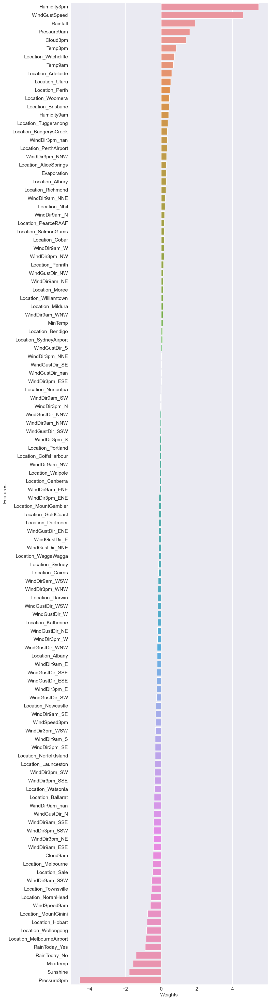

In [72]:
plt.figure(figsize=(10, 50))
sns.barplot(data = wt_df.sort_values("Weights", ascending=False), x= "Weights", y = "Features")

In [68]:
# It is the bais term that is added in the logistic regression model equation
print(model.intercept_)

[-2.30548392]


Each weight is applied to the value in a specific column of the input. Higher the weight, greater the impact of the column on the prediction.

## Making Predictions and Evaluating the Model

We can now use the trained model to make predictions on the training, test 

In [73]:
X_train = train_inputs[numeric_cols + encoded_cols]
X_val = val_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

In [75]:
train_preds = model.predict(X_train)
train_preds

array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)

We can output a probabilistic prediction using `predict_proba`.

In [76]:
train_probability = model.predict_proba(X_train)
train_probability

array([[0.68953627, 0.31046373],
       [0.98305652, 0.01694348],
       [0.83227162, 0.16772838],
       ...,
       [0.65406672, 0.34593328],
       [0.86037909, 0.13962091],
       [0.95042519, 0.04957481]])

The numbers above indicate the probabilities for the target classes "No" and "Yes".

In [77]:
model.classes_

array(['No', 'Yes'], dtype=object)

We can test the accuracy of the model's predictions by computing the percentage of matching values in `train_preds` and `train_targets`.

This can be done using the `accuracy_score` function from `sklearn.metrics`.


In [78]:
from sklearn.metrics import accuracy_score

accuracy_score(train_targets, train_preds)

0.8496117695136902

The model achieves an accuracy of 84.96% on the training set. We can visualize the breakdown of correctly and incorrectly classified inputs using a confusion matrix.

<img src="https://i.imgur.com/UM28BCN.png" width="480">

In [79]:
from sklearn.metrics import confusion_matrix

confusion_matrix(train_targets, train_preds, normalize= "true")

array([[0.94617713, 0.05382287],
       [0.48560987, 0.51439013]])

Let's define a helper function to generate predictions, compute the accuracy score and plot a confusion matrix for a given st of inputs.

In [80]:
def predict_and_plot(inputs, targets, name=''):
    preds = model.predict(inputs)
    
    accuracy = accuracy_score(targets, preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))
    
    cf = confusion_matrix(targets, preds, normalize='true')
    plt.figure()
    sns.heatmap(cf, annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} Confusion Matrix'.format(name));
    
    return preds

Accuracy: 84.96%


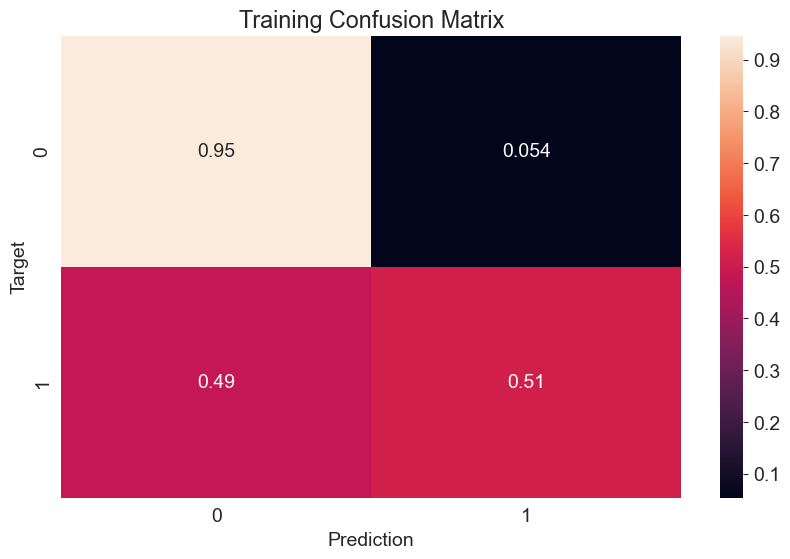

In [81]:
train_preds = predict_and_plot(X_train, train_targets, "Training")

Accuracy: 86.24%


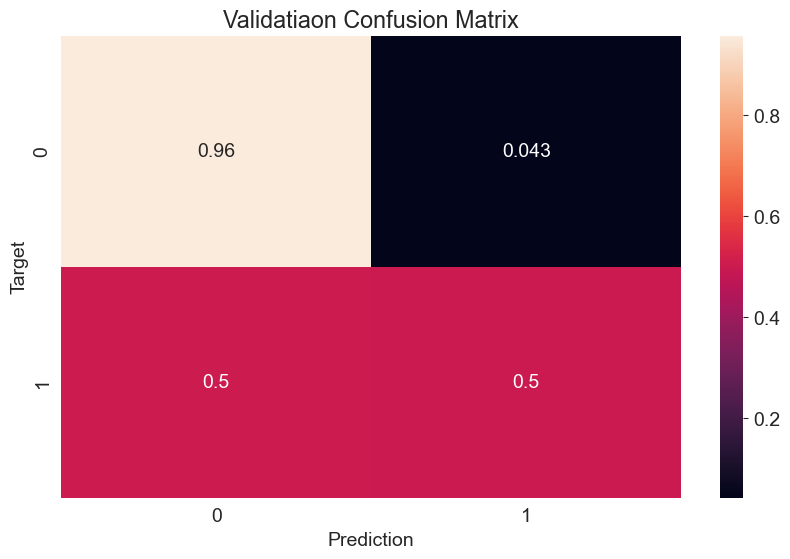

In [82]:
val_preds = predict_and_plot(X_val, val_targets, 'Validatiaon')

Accuracy: 83.06%


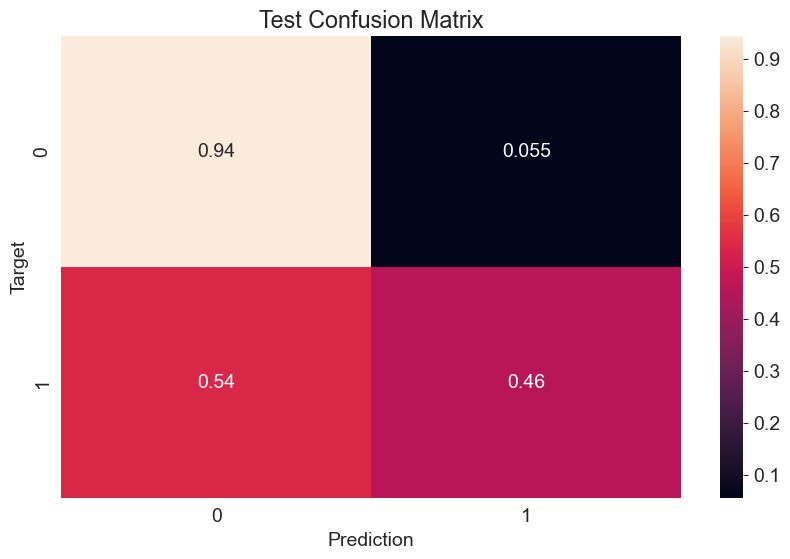

In [83]:
test_preds = predict_and_plot(X_test, test_targets, 'Test')

The accuracy of the model on the test and validation set are above 83%, which suggests that our model generalizes well to data it hasn't seen before. 

Also the TP of the confusion matrix is low because our data is baised as we have 20% only in that condition where there was rain today and rain tomorrow was 50-50.

But how good is 83% accuracy? While this depends on the nature of the problem and on business requirements, a good way to verify whether a model has actually learned something useful is to compare its results to a "random" or "dumb" model.

But definitely it can be improve if we work with the unbaised dataset.

Let's create two models: one that guesses randomly and another that always return "No". Both of these models completely ignore the inputs given to them.

In [85]:
# The code is defining a function called `random_guess` that takes in a parameter called `inputs`. Inside the function, it uses the `np.random.choice` 
# function from the NumPy library to randomly choose either "No" or "Yes" for each element in the `inputs` list. 
# The number of choices made is equal to the length of the `inputs` list. The function then returns a list of these randomly chosen values.
def random_guess(inputs):
    return np.random.choice(["No", "Yes"], len(inputs))

In [84]:
# The code is defining a function called `all_no` that takes in a parameter called `inputs`.
def all_no(inputs):
    return np.full(len(inputs), "No")

Let's check the accuracies of these two models on the test set.

In [86]:
print("Accuracy Score of random guess: " , accuracy_score(test_targets, random_guess(X_test)))
print("Accuracy Score of all no: " , accuracy_score(test_targets, all_no(X_test)))

Accuracy Score of random guess:  0.48591277499035124
Accuracy Score of all no:  0.7649556155924353


Our random model achieves an accuracy of 50% and our "always No" model achieves an accuracy of 76%. 

Thankfully, our model is better than a "dumb" or "random" model! This is not always the case, so it's a good practice to benchmark any model you train against such baseline models.

> **Methods to check the different models**: 
1. Initialize the `LogisticRegression` model with different arguments and try to achieve a higher accuracy. The arguments used for initializing the model are called hyperparameters (to differentiate them from weights and biases - parameters that are learned by the model during training). You can find the full list of arguments here: https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html 

2. Train a logistic regression model using just the numeric columns from the dataset. Does it perform better or worse than the model trained above?

3. Train a logistic regression model using just the categorical columns from the dataset. Does it perform better or worse than the model trained above?

4. Train a logistic regression model without feature scaling. Also try a different strategy for missing data imputation. Does it perform better or worse than the model trained above?

## Making Predictions on a Single Input

Once the model has been trained to a satisfactory accuracy, it can be used to make predictions on new data. Consider the following dictionary containing data collected from the Katherine weather department today.

Let's define a helper function to make predictions for individual inputs.

We've now created a Pandas dataframe with the same columns as `raw_df` (except `RainTomorrow`, which needs to be predicted). The dataframe contains just one row of data, containing the given input.


We must now apply the same transformations applied while training the model:

1. Imputation of missing values using the `imputer` created earlier
2. Scaling numerical features using the `scaler` created earlier
3. Encoding categorical features using the `encoder` created earlier

In [87]:
def predict_input(single_input):
    input_df = pd.DataFrame([single_input])
    input_df[numeric_cols] = imputer.transform(input_df[numeric_cols])
    input_df[numeric_cols] = scaler.transform(input_df[numeric_cols])
    input_df[encoded_cols] = encoder.transform(input_df[categorical_cols])
    X_input = input_df[numeric_cols + encoded_cols]
    pred = model.predict(X_input)[0]
    prob = model.predict_proba(X_input)[0][list(model.classes_).index(pred)]
    return pred, prob

In [90]:
new_input = {'Date': '2021-06-19',
             'Location': 'Uluru',
             'MinTemp': 23.2,
             'MaxTemp': 33.2,
             'Rainfall': 10.2,
             'Evaporation': 4.2,
             'Sunshine': np.nan,
             'WindGustDir': 'NNW',
             'WindGustSpeed': 52.0,
             'WindDir9am': 'NW',
             'WindDir3pm': 'NNE',
             'WindSpeed9am': 13.0,
             'WindSpeed3pm': 20.0,
             'Humidity9am': 89.0,
             'Humidity3pm': 58.0,
             'Pressure9am': 1004.8,
             'Pressure3pm': 1001.5,
             'Cloud9am': 8.0,
             'Cloud3pm': 5.0,
             'Temp9am': 25.7,
             'Temp3pm': 33.0,
             'RainToday': 'Yes'}

In [91]:
predict_input(new_input)

C:\Users\lenovo\AppData\Local\Temp\ipykernel_27016\2435838903.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lenovo\AppData\Local\Temp\ipykernel_27016\2435838903.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lenovo\AppData\Local\Temp\ipykernel_27016\2435838903.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragment

('Yes', 0.76771809859374)

## Saving and Loading Trained Models

We can save the parameters (weights and biases) of our trained model to disk, so that we needn't retrain the model from scratch each time we wish to use it. Along with the model, it's also important to save imputers, scalers, encoders and even column names. Anything that will be required while generating predictions using the model should be saved.

We can use the `joblib` module to save and load Python objects on the disk. 

In [92]:
import joblib

In [93]:
# Let's first create a dictionary containing all the required objects.

weather_forecaste = {
    'model': model,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input_cols,
    'target_col': target_col,
    'numeric_cols': numeric_cols,
    'categorical_cols': categorical_cols,
    'encoded_cols': encoded_cols
}


In [94]:
# We can now save this to a file using `joblib.dump`

joblib.dump(weather_forecaste, "weather_forecaste.joblib")

['weather_forecaste.joblib']

The object can be loaded back using `joblib.load`

In [96]:
todays_weather = joblib.load("weather_forecaste.joblib")

Let's use the loaded model to make predictions on the original test set.

In [97]:
test_preds2 = todays_weather['model'].predict(X_test)
accuracy_score(test_targets, test_preds2)

0.8305673485140872

As expected, we get the same result as the original model.

## Putting it all Together

People in industry may work with three notebooks as given below in the same folder. So the improvement and accuracy work in hands in hands.

### Data Preprocessing

In [ ]:
import opendatasets as od
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder

# Download the dataset
od.download('https://www.kaggle.com/jsphyg/weather-dataset-rattle-package')
raw_df = pd.read_csv('weather-dataset-rattle-package/weatherAUS.csv')
raw_df.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)

# Create training, validation and test sets
year = pd.to_datetime(raw_df.Date).dt.year
train_df, val_df, test_df = raw_df[year < 2015], raw_df[year == 2015], raw_df[year > 2015]

# Create inputs and targets
input_cols = list(train_df.columns)[1:-1]
target_col = 'RainTomorrow'
train_inputs, train_targets = train_df[input_cols].copy(), train_df[target_col].copy()
val_inputs, val_targets = val_df[input_cols].copy(), val_df[target_col].copy()
test_inputs, test_targets = test_df[input_cols].copy(), test_df[target_col].copy()

# Identify numeric and categorical columns
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()[:-1]
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()

# Impute missing numerical values
imputer = SimpleImputer(strategy = 'mean').fit(raw_df[numeric_cols])
train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

# Scale numeric features
scaler = MinMaxScaler().fit(raw_df[numeric_cols])
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

# One-hot encode categorical features
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore').fit(raw_df[categorical_cols])
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

# Save processed data to disk
train_inputs.to_parquet('train_inputs.parquet')
val_inputs.to_parquet('val_inputs.parquet')
test_inputs.to_parquet('test_inputs.parquet')
pd.DataFrame(train_targets).to_parquet('train_targets.parquet')
pd.DataFrame(val_targets).to_parquet('val_targets.parquet')
pd.DataFrame(test_targets).to_parquet('test_targets.parquet')

# Load processed data from disk
train_inputs = pd.read_parquet('train_inputs.parquet')
val_inputs = pd.read_parquet('val_inputs.parquet')
test_inputs = pd.read_parquet('test_inputs.parquet')
train_targets = pd.read_parquet('train_targets.parquet')[target_col]
val_targets = pd.read_parquet('val_targets.parquet')[target_col]
test_targets = pd.read_parquet('test_targets.parquet')[target_col]

### Model Training and Evaluation

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import joblib

# Select the columns to be used for training/prediction
X_train = train_inputs[numeric_cols + encoded_cols]
X_val = val_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

# Create and train the model
model = LogisticRegression(solver='liblinear')
model.fit(X_train, train_targets)

# Generate predictions and probabilities
train_preds = model.predict(X_train)
train_probs = model.predict_proba(X_train)
accuracy_score(train_targets, train_preds)

# Helper function to predict, compute accuracy & plot confustion matrix
def predict_and_plot(inputs, targets, name=''):
    preds = model.predict(inputs)
    accuracy = accuracy_score(targets, preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))
    cf = confusion_matrix(targets, preds, normalize='true')
    plt.figure()
    sns.heatmap(cf, annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} Confusion Matrix'.format(name));    
    return preds

# Evaluate on validation and test set
val_preds = predict_and_plot(X_val, val_targets, 'Validation')
test_preds = predict_and_plot(X_test, test_targets, 'Test')

# Save the trained model & load it back
aussie_rain = {'model': model, 'imputer': imputer, 'scaler': scaler, 'encoder': encoder,
               'input_cols': input_cols, 'target_col': target_col, 'numeric_cols': numeric_cols,
               'categorical_cols': categorical_cols, 'encoded_cols': encoded_cols}
joblib.dump(aussie_rain, 'aussie_rain.joblib')
aussie_rain2 = joblib.load('aussie_rain.joblib')

### Prediction on Single Inputs 

In [ ]:
def predict_input(single_input):
    input_df = pd.DataFrame([single_input])
    input_df[numeric_cols] = imputer.transform(input_df[numeric_cols])
    input_df[numeric_cols] = scaler.transform(input_df[numeric_cols])
    input_df[encoded_cols] = encoder.transform(input_df[categorical_cols])
    X_input = input_df[numeric_cols + encoded_cols]
    pred = model.predict(X_input)[0]
    prob = model.predict_proba(X_input)[0][list(model.classes_).index(pred)]
    return pred, prob

new_input = {'Date': '2021-06-19',
             'Location': 'Launceston',
             'MinTemp': 23.2,
             'MaxTemp': 33.2,
             'Rainfall': 10.2,
             'Evaporation': 4.2,
             'Sunshine': np.nan,
             'WindGustDir': 'NNW',
             'WindGustSpeed': 52.0,
             'WindDir9am': 'NW',
             'WindDir3pm': 'NNE',
             'WindSpeed9am': 13.0,
             'WindSpeed3pm': 20.0,
             'Humidity9am': 89.0,
             'Humidity3pm': 58.0,
             'Pressure9am': 1004.8,
             'Pressure3pm': 1001.5,
             'Cloud9am': 8.0,
             'Cloud3pm': 5.0,
             'Temp9am': 25.7,
             'Temp3pm': 33.0,
             'RainToday': 'Yes'}

predict_input(new_input)

## Summary and References

Logistic regression is a commonly used technique for solving binary classification problems. In a logistic regression model: 

- we take linear combination (or weighted sum of the input features) 
- we apply the sigmoid function to the result to obtain a number between 0 and 1
- this number represents the probability of the input being classified as "Yes"
- instead of RMSE, the cross entropy loss function is used to evaluate the results


Here's a visual summary of how a logistic regression model is structured ([source](http://datahacker.rs/005-pytorch-logistic-regression-in-pytorch/)):


<img src="https://i.imgur.com/YMaMo5D.png" width="480">


To train a logistic regression model, we can use the `LogisticRegression` class from Scikit-learn. We covered the following topics in this tutorial:

- Downloading a real-world dataset from Kaggle
- Exploratory data analysis and visualization
- Splitting a dataset into training, validation & test sets
- Filling/imputing missing values in numeric columns
- Scaling numeric features to a $(0,1)$ range
- Encoding categorical columns as one-hot vectors
- Training a logistic regression model using Scikit-learn
- Evaluating a model using a validation set and test set
- Saving a model to disk and loading it back



Check out the following resources to learn more:

* https://www.youtube.com/watch?v=-la3q9d7AKQ&list=PLNeKWBMsAzboR8vvhnlanxCNr2V7ITuxy&index=1
* https://www.kaggle.com/prashant111/extensive-analysis-eda-fe-modelling
* https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction#Baseline
* https://jovian.ai/aakashns/03-logistic-regression


Try training logistic regression models on the following datasets:

- [Breast cancer detection](https://www.kaggle.com/uciml/breast-cancer-wisconsin-data): Predicting whether a tumor  is "benign" (noncancerous) or "malignant" (cancerous) using information like its radius, texture etc.
- [Loan Repayment Prediction](https://www.kaggle.com/c/home-credit-default-risk) - Predicting whether applicants will repay a home loan based on factors like age, income, loan amount, no. of children etc.
- [Handwritten Digit Recognition](https://www.kaggle.com/c/digit-recognizer) - Identifying which digit from 0 to 9 a picture of handwritten text represents.